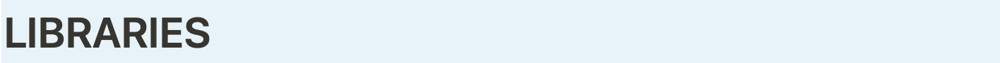

In [7]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
from scipy import ndimage
from skimage.transform import resize, rescale
from tensorflow.keras.preprocessing.image import img_to_array

import tensorflow as tf
from tensorflow.keras.layers import (
    Input, Dense, Conv2D, MaxPooling2D, Dropout, Activation,
    Conv2DTranspose, UpSampling2D, add
)
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
from tensorflow.keras.utils import plot_model

# Set random seed for reproducibility
np.random.seed(0)

# Check TensorFlow version
print(tf.__version__)


2.16.2


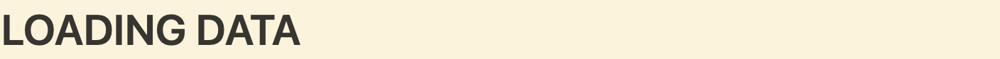

In [8]:
import os
import re
import cv2
import numpy as np
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import img_to_array

def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)', key)]
    return sorted(data, key=alphanum_key)

# Define image size
SIZE = 512

# === HR IMAGES ===
high_img = []
hr_path = '/Users/kunalnarwani/Desktop/Thesis/unet-thesis/Super-resolution/data/HR'
hr_files = sorted_alphanumeric(os.listdir(hr_path))

for fname in tqdm(hr_files):
    if fname.endswith('.png'):
        img = cv2.imread(os.path.join(hr_path, fname))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))

# === LR IMAGES ===
low_img = []
lr_path = '/Users/kunalnarwani/Desktop/Thesis/unet-thesis/Super-resolution/data/LR'
lr_files = sorted_alphanumeric(os.listdir(lr_path))

for fname in tqdm(lr_files):
    if fname.endswith('.png'):
        img = cv2.imread(os.path.join(lr_path, fname))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        low_img.append(img_to_array(img))


100%|██████████| 800/800 [00:11<00:00, 68.84it/s]


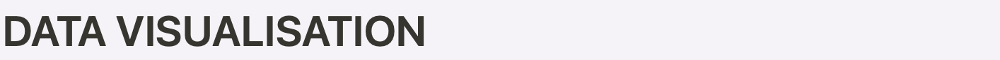

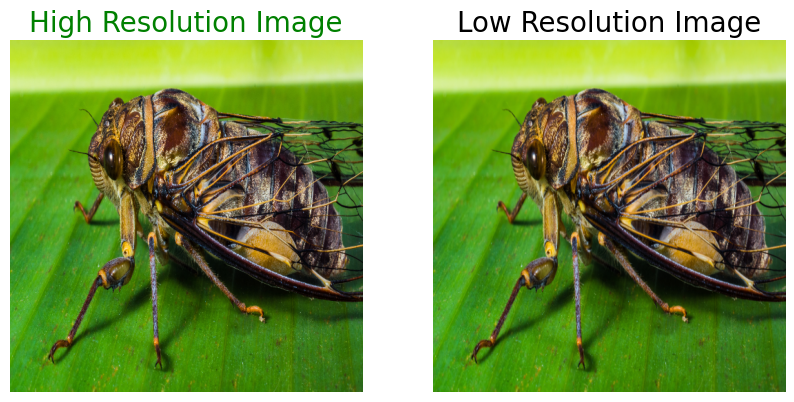

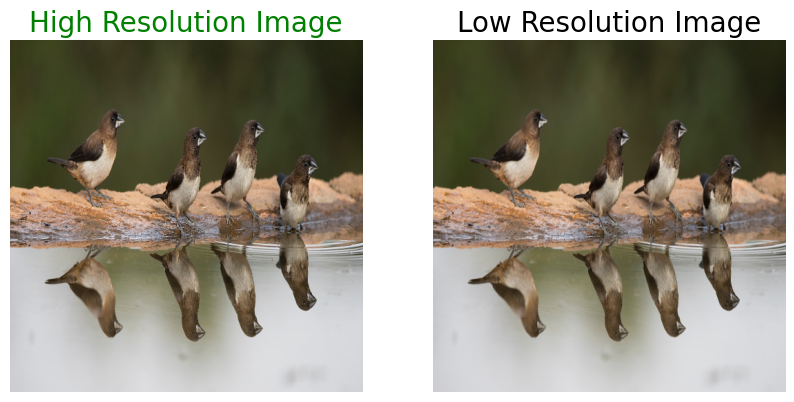

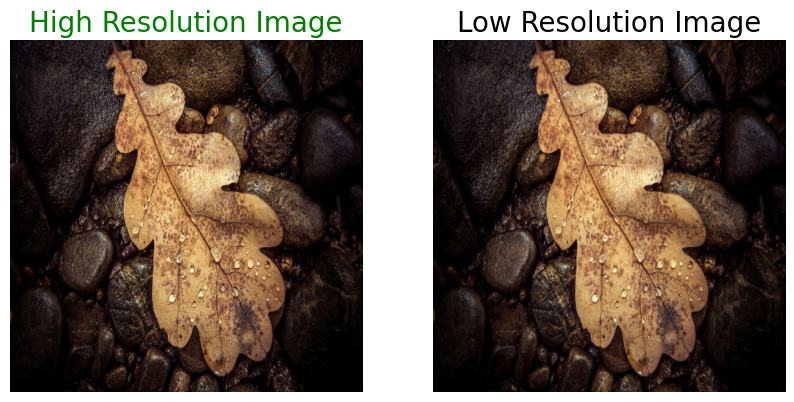

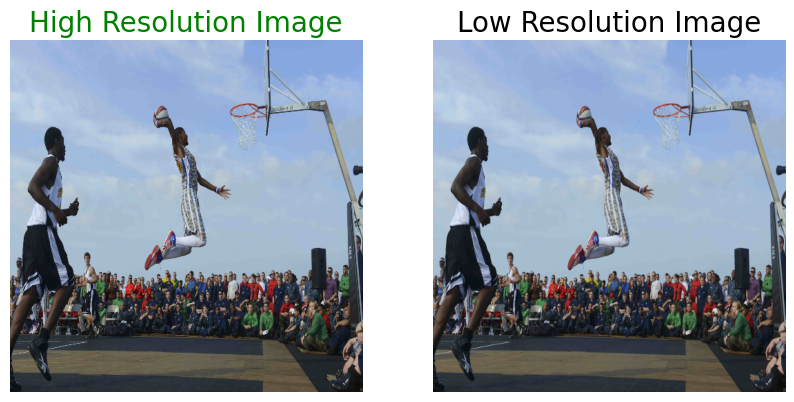

In [9]:
import matplotlib.pyplot as plt

# sanity check: make sure they match up
assert len(high_img) == len(low_img), \
    f"Found {len(high_img)} HR but {len(low_img)} LR images!"

n_samples = len(high_img)  # now guaranteed to be the same

for _ in range(4):
    idx = np.random.randint(n_samples)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))
    ax1.imshow(high_img[idx].astype('float32'))
    ax1.set_title('High Resolution Image', color='green', fontsize=20)
    ax1.axis('off')

    ax2.imshow(low_img[idx].astype('float32'))
    ax2.set_title('Low Resolution Image', color='black', fontsize=20)
    ax2.axis('off')

    plt.show()


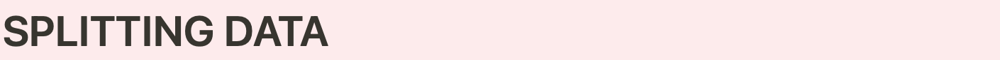

In [10]:

# 1) Convert to NumPy arrays
high_arr = np.array(high_img, dtype='float32')
low_arr  = np.array(low_img,  dtype='float32')

# 2) Sanity check
assert high_arr.shape == low_arr.shape, (
    f"HR and LR must be same shape, got {high_arr.shape} vs {low_arr.shape}"
)

# 3) Split indices
n_train = 700
n_val   = 90  # so train + val = 810

# Training set
train_high_image = high_arr[:n_train]
train_low_image  = low_arr[:n_train]

# Validation set
val_start = n_train
val_end   = n_train + n_val
validation_high_image = high_arr[val_start:val_end]
validation_low_image  = low_arr[val_start:val_end]

# Test set (everything after index 810)
test_high_image = high_arr[val_end:]
test_low_image  = low_arr[val_end:]

# 4) (Re-)reshape if you really need to enforce the 4D shape
#    — though high_arr already is (N, SIZE, SIZE, 3)
train_high_image      = train_high_image.reshape((-1, SIZE, SIZE, 3))
train_low_image       = train_low_image.reshape((-1, SIZE, SIZE, 3))
validation_high_image = validation_high_image.reshape((-1, SIZE, SIZE, 3))
validation_low_image  = validation_low_image.reshape((-1, SIZE, SIZE, 3))
test_high_image       = test_high_image.reshape((-1, SIZE, SIZE, 3))
test_low_image        = test_low_image.reshape((-1, SIZE, SIZE, 3))

# 5) Verify shapes
print("Shape of training images:   ", train_high_image.shape, train_low_image.shape)
print("Shape of validation images: ", validation_high_image.shape, validation_low_image.shape)
print("Shape of test images:       ", test_high_image.shape, test_low_image.shape)


Shape of training images:    (700, 512, 512, 3) (700, 512, 512, 3)
Shape of validation images:  (90, 512, 512, 3) (90, 512, 512, 3)
Shape of test images:        (10, 512, 512, 3) (10, 512, 512, 3)


# ARCITECTURE OF MODEL 


In [10]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, Conv2D, MaxPool2D, Conv2DTranspose,
    BatchNormalization, Activation, Concatenate, LeakyReLU
)
from tensorflow.keras.utils import plot_model

def conv_block(inputs, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x

def encoder_block(inputs, num_filters):
    x = conv_block(inputs, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p

def decoder_block(inputs, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_unet(input_shape=(512, 512, 3)):  # ← updated here
    inputs = Input(shape=input_shape)

    # Encoder
    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    # Bridge
    b1 = conv_block(p4, 1024)

    # Decoder
    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    # Output layer: Conv + LeakyReLU
    x = Conv2D(3, 1, padding="same")(d4)
    outputs = LeakyReLU(alpha=0.1)(x)

    model = Model(inputs, outputs, name="U-Net")
    model.summary()
    return model

# Build and plot for 512×512
model = build_unet((512, 512, 3))
plot_model(model, to_file='super_res_UNet_512.png', show_shapes=True)


/Users/kunalnarwani/Desktop/Thesis/unet-thesis/.venv/lib/python3.11/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 512, 512,  │      1,792 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        256 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_18       │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 512, 512,  │     36,928 │ activation_18[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        256 │ conv2d_20[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_19       │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 256, 256,  │          0 │ activation_19[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 256, 256,  │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_20       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 256, 256,  │    147,584 │ activation_20[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_21       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 128, 128,  │          0 │ activation_21[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 128, 128,  │    295,168 │ max_pooling2d_5[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │      1,024 │ conv2d_23[0][0] 

 Total params: 31,055,427 (118.47 MB)

 Trainable params: 31,043,651 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


In [11]:
def pixel_mse_loss(x,y):
    return tf.reduce_mean( (x - y) ** 2 )

In [12]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = pixel_mse_loss,
              metrics = ['acc'])
model.summary()
plot_model(model, to_file ='super_res(U-NET).png',show_shapes=True)

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 512, 512,  │      1,792 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        256 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_18       │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 512, 512,  │     36,928 │ activation_18[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        256 │ conv2d_20[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_19       │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 256, 256,  │          0 │ activation_19[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 256, 256,  │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_20       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 256, 256,  │    147,584 │ activation_20[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_21       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 128, 128,  │          0 │ activation_21[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 128, 128,  │    295,168 │ max_pooling2d_5[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │      1,024 │ conv2d_23[0][0] 

 Total params: 31,055,427 (118.47 MB)

 Trainable params: 31,043,651 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


In [13]:
import sys, tensorflow as tf
print("python exec:", sys.executable)
print("TF version:", tf.__version__)
print("GPUs:", tf.config.list_physical_devices("GPU"))


python exec: /Users/kunalnarwani/Desktop/Thesis/unet-thesis/.venv/bin/python
TF version: 2.16.2
GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [14]:
model.fit(train_low_image, train_high_image, epochs = 10, batch_size = 1,
          validation_data = (validation_low_image,validation_high_image))

Epoch 1/10


2025-07-26 11:24:31.635391: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


700/700 ━━━━━━━━━━━━━━━━━━━━ 511s 713ms/step - acc: 0.5078 - loss: 0.0361 - val_acc: 0.6986 - val_loss: 0.0105
Epoch 2/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 504s 719ms/step - acc: 0.5902 - loss: 0.0143 - val_acc: 0.7525 - val_loss: 0.0069
Epoch 3/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 499s 713ms/step - acc: 0.6220 - loss: 0.0111 - val_acc: 0.7613 - val_loss: 0.0076
Epoch 4/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 505s 722ms/step - acc: 0.6317 - loss: 0.0117 - val_acc: 0.7463 - val_loss: 0.0053
Epoch 5/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 500s 714ms/step - acc: 0.6623 - loss: 0.0098 - val_acc: 0.6656 - val_loss: 0.0057
Epoch 6/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 503s 719ms/step - acc: 0.6482 - loss: 0.0085 - val_acc: 0.7545 - val_loss: 0.0118
Epoch 7/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 506s 723ms/step - acc: 0.6603 - loss: 0.0088 - val_acc: 0.7747 - val_loss: 0.0073
Epoch 8/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 503s 718ms/step - acc: 0.6756 - loss: 0.0073 - val_acc: 0.7499 - val_loss: 0.0039
Epoch 9/10
700/700 ━━━━━━━━━━━━━━━━

In [11]:

# 1) Convert to NumPy arrays
high_arr = np.array(high_img, dtype='float32')
low_arr  = np.array(low_img,  dtype='float32')

# 2) Sanity check
assert high_arr.shape == low_arr.shape, (
    f"HR and LR must be same shape, got {high_arr.shape} vs {low_arr.shape}"
)

# 3) Split indices
n_train = 700
n_val   = 90  

# Training set
train_high_image = high_arr[:n_train]
train_low_image  = low_arr[:n_train]

# Validation set
val_start = n_train
val_end   = n_train + n_val
validation_high_image = high_arr[val_start:val_end]
validation_low_image  = low_arr[val_start:val_end]

# Test set (everything after index 810)
test_high_image = high_arr[val_end:]
test_low_image  = low_arr[val_end:]

# 4) (Re-)reshape if you really need to enforce the 4D shape
#    — though high_arr already is (N, SIZE, SIZE, 3)
train_high_image      = train_high_image.reshape((-1, SIZE, SIZE, 3))
train_low_image       = train_low_image.reshape((-1, SIZE, SIZE, 3))
validation_high_image = validation_high_image.reshape((-1, SIZE, SIZE, 3))
validation_low_image  = validation_low_image.reshape((-1, SIZE, SIZE, 3))
test_high_image       = test_high_image.reshape((-1, SIZE, SIZE, 3))
test_low_image        = test_low_image.reshape((-1, SIZE, SIZE, 3))

# 5) Verify shapes
print("Shape of training images:   ", train_high_image.shape, train_low_image.shape)
print("Shape of validation images: ", validation_high_image.shape, validation_low_image.shape)
print("Shape of test images:       ", test_high_image.shape, test_low_image.shape)


Shape of training images:    (700, 512, 512, 3) (700, 512, 512, 3)
Shape of validation images:  (90, 512, 512, 3) (90, 512, 512, 3)
Shape of test images:        (10, 512, 512, 3) (10, 512, 512, 3)


In [16]:
model.save('superresolution_unet_512.h5')

In [12]:
def PSNR(y_true,y_pred):
    mse=tf.reduce_mean( (y_true - y_pred) ** 2 )
    return 20 * log10(1/ (mse ** 0.5))

def log10(x):
    numerator = tf.math.log(x)
    denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
    return numerator / denominator

def pixel_MSE(y_true,y_pred):
    return tf.reduce_mean( (y_true - y_pred) ** 2 )

In [15]:
from tensorflow.keras.models import load_model

# ─── adjust this path to where your .h5 really lives ───────────────────────
MODEL_PATH = "/Users/kunalnarwani/Desktop/Thesis/unet-thesis/Super-resolution/superresolution_unet_512.h5"

# load it (compile=False so it won’t try to re-compile if you used custom losses)
model = load_model(MODEL_PATH, compile=False)

print("Model loaded—you can now call model.predict on it!")


2025-07-26 13:23:48.780887: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2025-07-26 13:23:48.787098: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2025-07-26 13:23:48.787373: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.92 GB
2025-07-26 13:23:48.788873: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-07-26 13:23:48.789182: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model loaded—you can now call model.predict on it!


Number of test images: 10


2025-07-26 13:23:55.664593: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/step


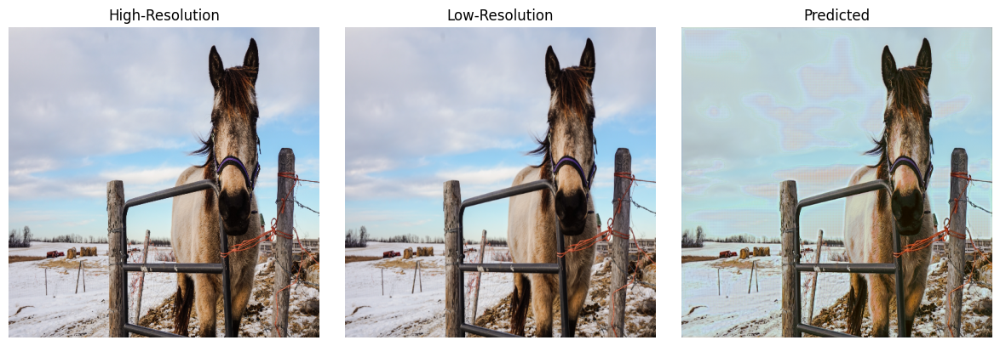

PSNR: tf.Tensor(26.744383, shape=(), dtype=float32) dB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


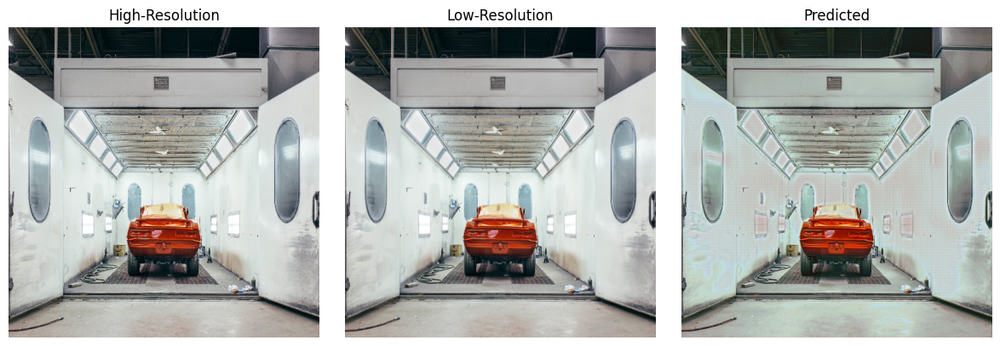

PSNR: tf.Tensor(22.753258, shape=(), dtype=float32) dB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


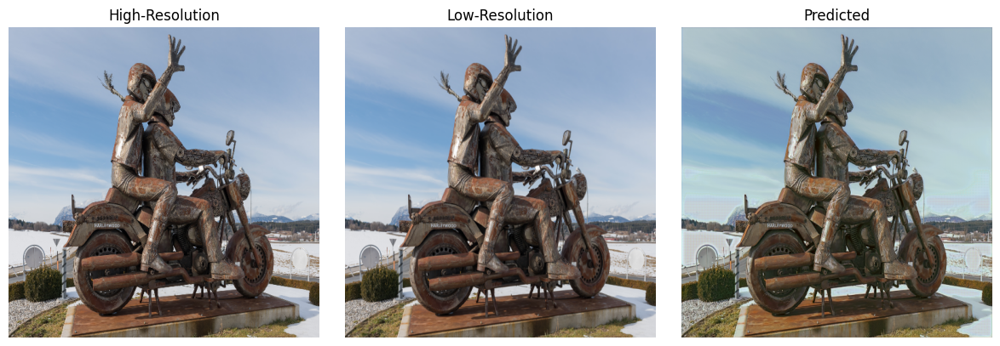

PSNR: tf.Tensor(29.300217, shape=(), dtype=float32) dB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


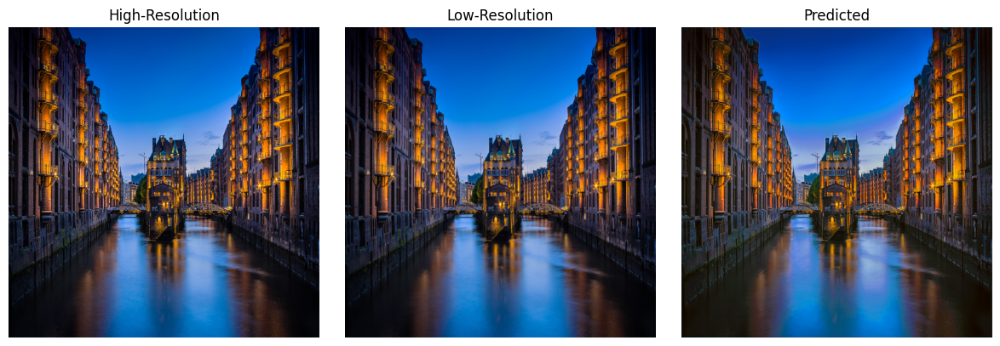

PSNR: tf.Tensor(26.039265, shape=(), dtype=float32) dB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


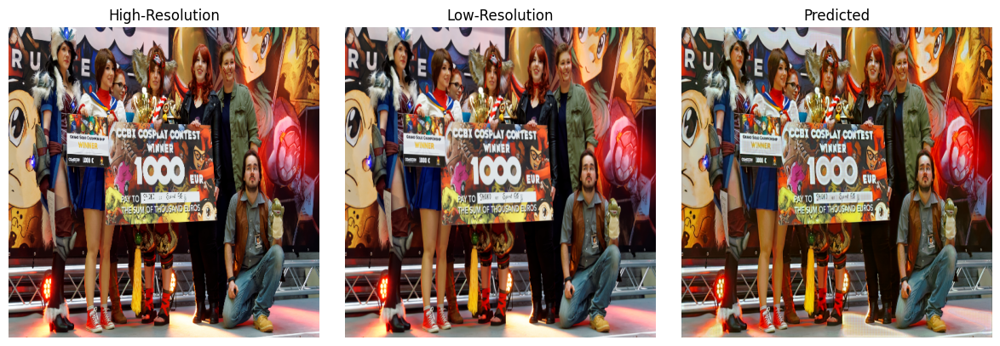

PSNR: tf.Tensor(25.103819, shape=(), dtype=float32) dB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


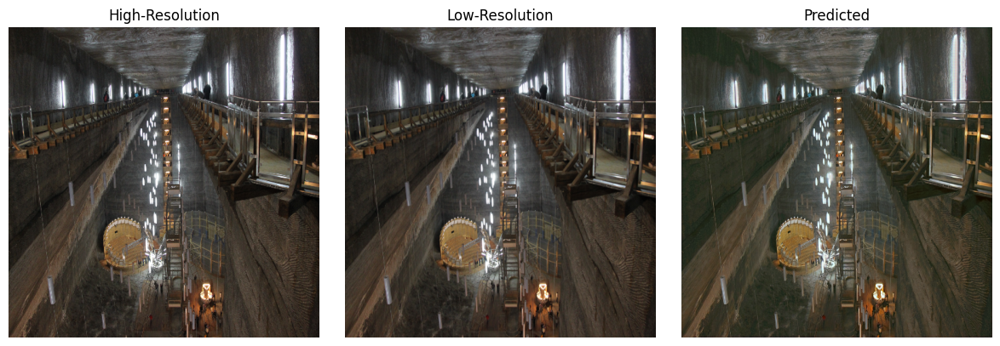

PSNR: tf.Tensor(29.836004, shape=(), dtype=float32) dB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


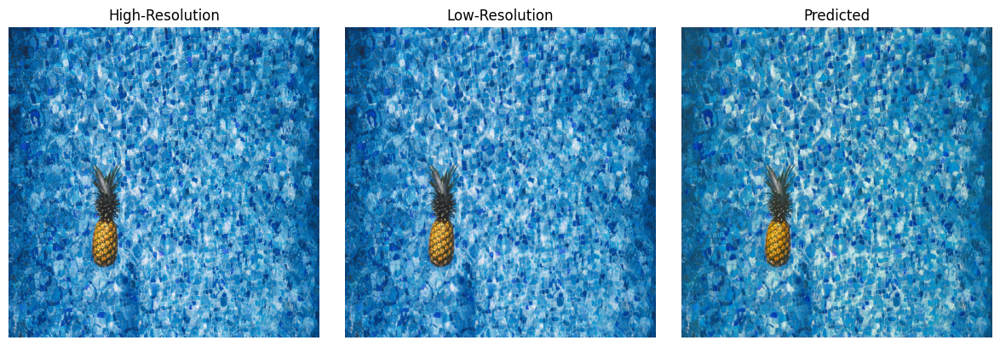

PSNR: tf.Tensor(24.908792, shape=(), dtype=float32) dB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


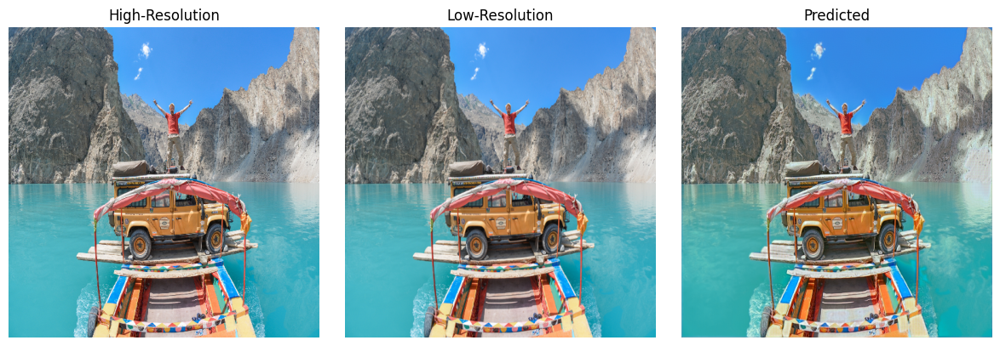

PSNR: tf.Tensor(25.276377, shape=(), dtype=float32) dB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


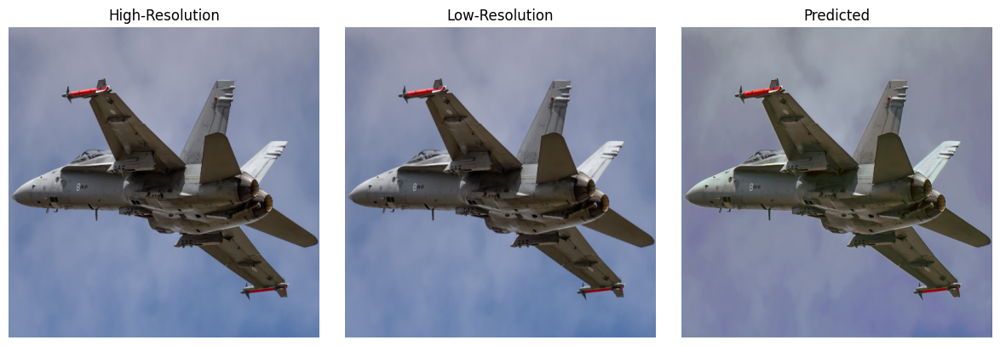

PSNR: tf.Tensor(30.30263, shape=(), dtype=float32) dB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


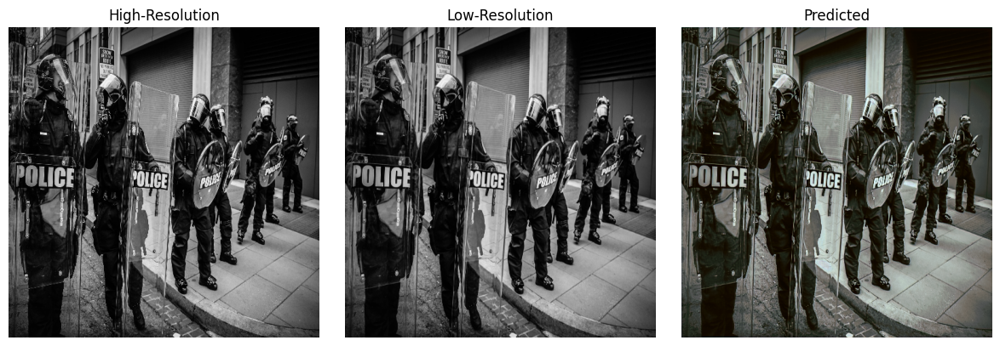

PSNR: tf.Tensor(27.901588, shape=(), dtype=float32) dB


In [16]:

import matplotlib.pyplot as plt

# how many test samples do we actually have?
n_test = test_low_image.shape[0]
print("Number of test images:", n_test)


def plot_images(hr, lr, pred):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(hr)
    plt.title("High-Resolution")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(lr)
    plt.title("Low-Resolution")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(pred)
    plt.title("Predicted")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


# loop safely over whatever is there
for i in range(n_test):
    hr = test_high_image[i]
    lr = test_low_image[i]
    pred = model.predict(lr.reshape(1, SIZE, SIZE, 3))  # shape (1,256,256,3)
    pred = np.clip(pred, 0.0, 1.0).reshape(SIZE, SIZE, 3)
    plot_images(hr, lr, pred)
    print("PSNR:", PSNR(hr, pred), "dB")


In [19]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from skimage.metrics import peak_signal_noise_ratio

# 1) Load your model
model = load_model(
    "/Users/kunalnarwani/Desktop/Thesis/unet-thesis/Super-resolution/superresolution_unet_512.h5",
    compile=False
)

# 2) Prepare storage
psnr_vals, ssim_vals, ms_ssim_vals = [], [], []

n_test = test_low_image.shape[0]
print("Number of test images:", n_test)

for i in range(n_test):
    hr   = test_high_image[i]                # H×W×3 in [0,1]
    lr   = test_low_image[i]                 # same shape
    pred = model.predict(lr[None, ...])[0]   # H×W×3 in [0,1]

    # PSNR
    psnr_vals.append(
        peak_signal_noise_ratio(hr, pred, data_range=1.0)
    )

    # SSIM via TensorFlow (no win_size issue)
    ssim_vals.append(
        tf.image.ssim(
            hr[None], pred[None], max_val=1.0
        ).numpy()[0]
    )

    # MS-SSIM via TensorFlow
    ms_ssim_vals.append(
        tf.image.ssim_multiscale(
            hr[None], pred[None], max_val=1.0
        ).numpy()[0]
    )

# Summarize
def mean_std(x):
    return np.mean(x), np.std(x)

m_psnr, s_psnr     = mean_std(psnr_vals)
m_ssim, s_ssim     = mean_std(ssim_vals)
m_msssim, s_msssim = mean_std(ms_ssim_vals)

print(f"\nOver {n_test} images:")
print(f" PSNR    : {m_psnr:.4f} ± {s_psnr:.4f} dB")
print(f" SSIM    : {m_ssim:.4f} ± {s_ssim:.4f}")
print(f" MS-SSIM : {m_msssim:.4f} ± {s_msssim:.4f}")


Number of test images: 10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 761ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step

Over 10 images:
 PSNR    : 26.8062 ± 2.3380 dB
 SSIM    : 0.8763 ± 0.0641
 MS-SSIM : 0.9610 ± 0.0264
